In [1]:
pip install ultralytics opencv-python deep_sort_realtime torch torchvision

In [2]:
!pip install -q ultralytics opencv-python-headless scipy

In [3]:
# cd to your preferred directory and clone this repo
! git clone https://github.com/KaiyangZhou/deep-person-reid.git

fatal: destination path 'deep-person-reid' already exists and is not an empty directory.


In [4]:
cd deep-person-reid/

/content/deep-person-reid


In [5]:
pwd

'/content/deep-person-reid'

In [6]:
# install dependencies
# make sure `which python` and `which pip` point to the correct path
! pip install -r requirements.txt

In [7]:
# install torchreid (don't need to re-build it if you modify the source code)
! python setup.py develop

2025-07-15 16:43:09.795270: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1752597789.831684    3509 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1752597789.841991    3509 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-07-15 16:43:09.892004: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
running develop
/usr/local/lib/python3.11/dist-packages/setuptools/command/develop.py:41: EasyInstallDeprecationWarni

In [8]:
from torchreid.utils import FeatureExtractor

✅ Loaded YOLO – classes: {0: 'ball', 1: 'goalkeeper', 2: 'player', 3: 'referee'}
Successfully loaded imagenet pretrained weights from "/root/.cache/torch/checkpoints/osnet_x1_0_imagenet.pth"
** The following layers are discarded due to unmatched keys or layer size: ['classifier.weight', 'classifier.bias']
Model: osnet_x1_0
- params: 2,193,616
- flops: 978,878,352


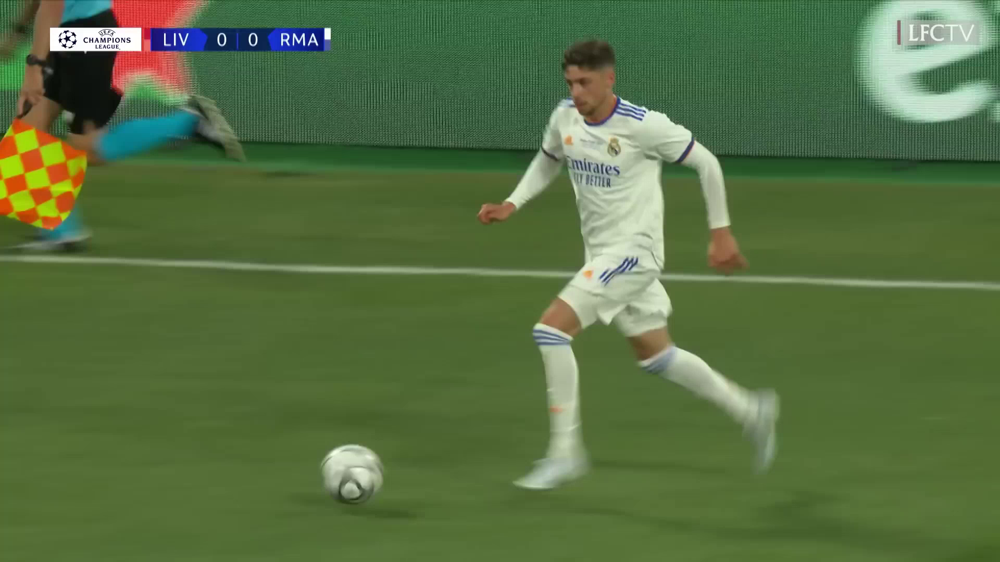

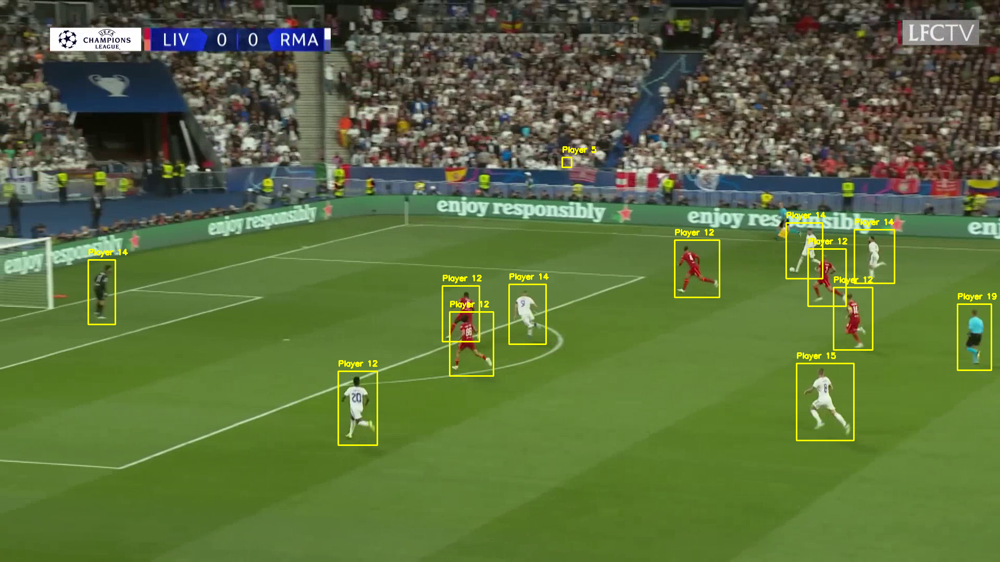

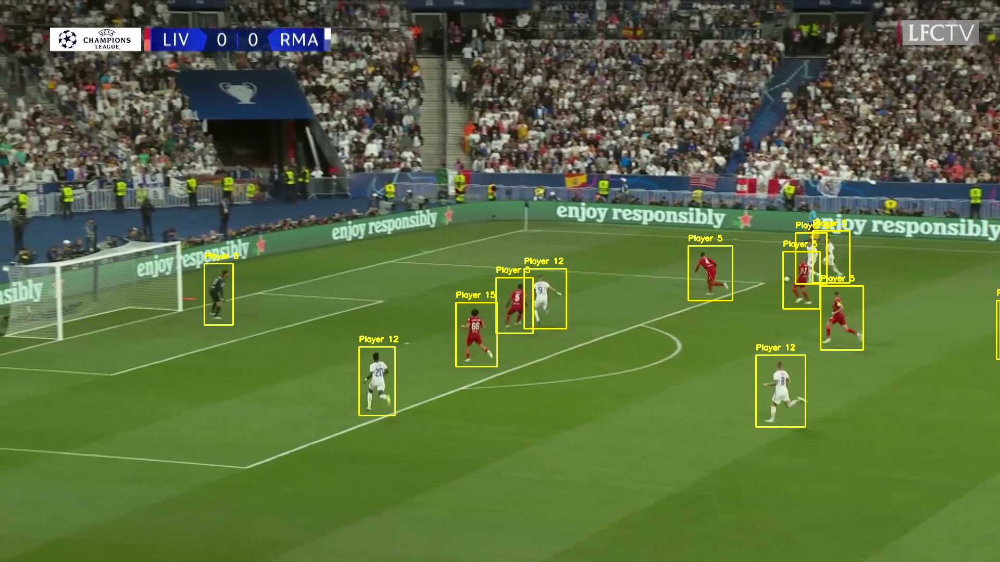

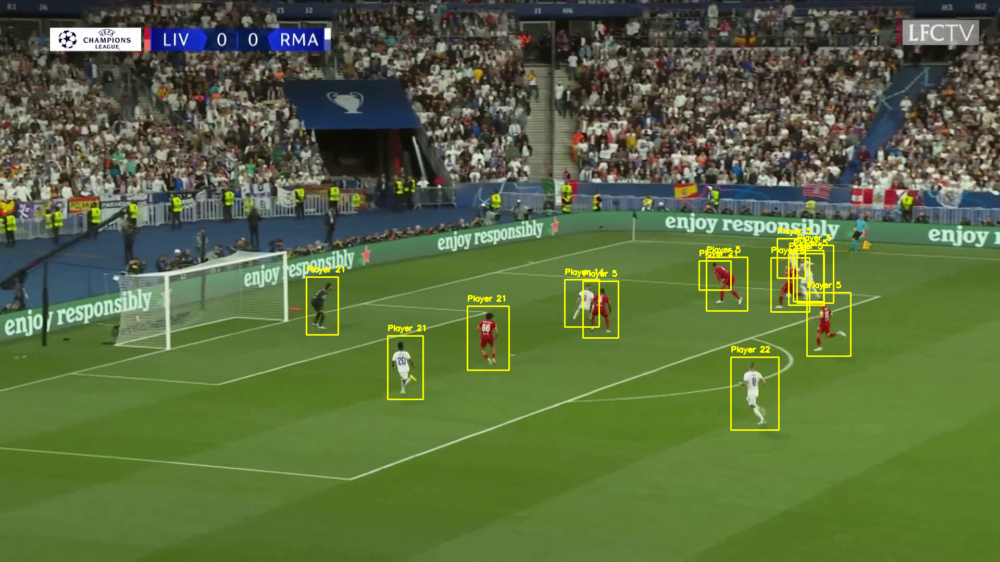

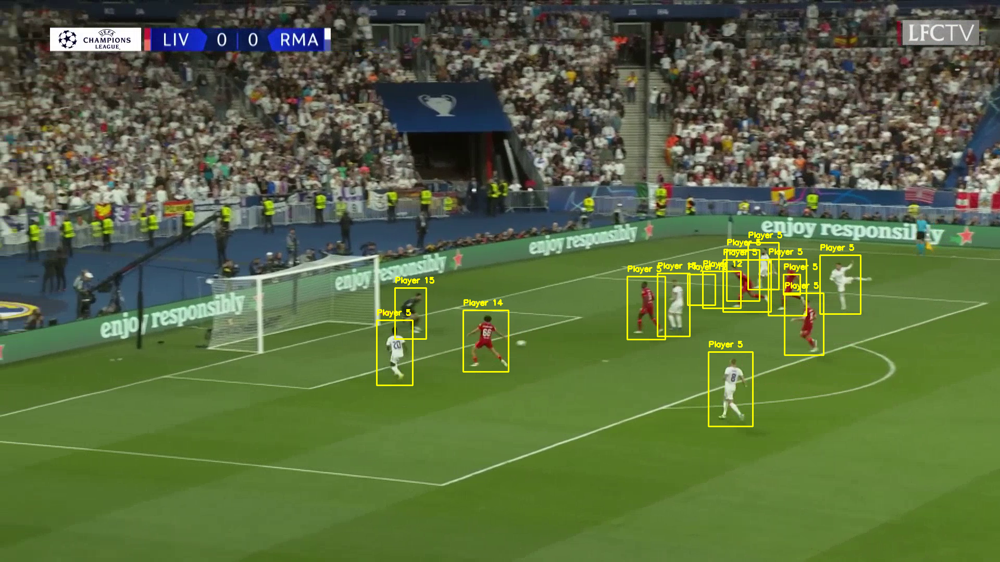

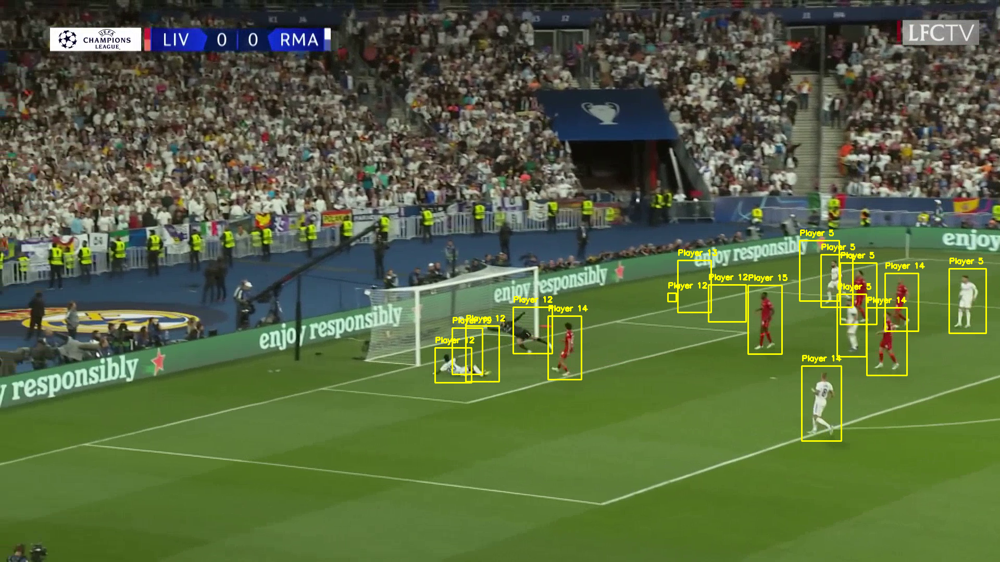

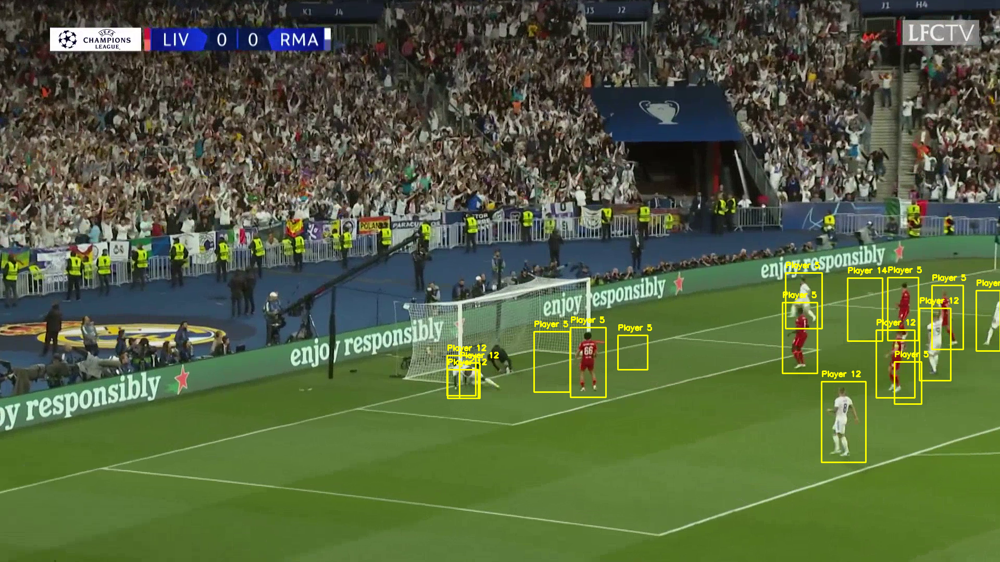

✅ Video processing complete. Output saved as 'tracked_output.mp4'


In [11]:
# =============================
# 🔧 Step 1: Install TorchReID
# =============================
# !git clone https://github.com/KaiyangZhou/deep-person-reid.git
# %cd deep-person-reid
# !pip install -r requirements.txt
# !python setup.py install
# %cd ..

# =============================
# ✅ Step 2: Imports
# =============================
import cv2
import torch
import numpy as np
from ultralytics import YOLO
from deep_sort_realtime.deepsort_tracker import DeepSort
from scipy.spatial.distance import cosine
from google.colab.patches import cv2_imshow
from torchreid.utils import FeatureExtractor  # Correct import

# =============================
# 🎯 Step 3: Re-ID Feature Extractor
# =============================
class ReIDExtractor:
    def __init__(self, model_name='osnet_x1_0', device='cuda' if torch.cuda.is_available() else 'cpu'):
        self.extractor = FeatureExtractor(
            model_name = model_name,
            model_path = '',
            device = device
        )

    def get_embedding(self, img_bgr):
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        return self.extractor(img_rgb).squeeze()  # (2048,)

# =============================
# ⚙️ Step 4: Initialization
# =============================
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# 4.a. Load YOLOv8
model = YOLO('/content/best.pt')  # Replace with your model
print('✅ Loaded YOLO – classes:', model.model.names)

# 4.b. DeepSORT tracker
tracker = DeepSort(max_age=30)

# 4.c. ReID extractor
extractor = ReIDExtractor(device=DEVICE)

# 4.d. Memory for ID embeddings
id_memory = {}

# 4.e. Video IO
cap_path = '/content/broadcast.mp4'
cap = cv2.VideoCapture(cap_path)
if not cap.isOpened():
    raise RuntimeError(f'❌ Could not open video: {cap_path}')

fps = cap.get(cv2.CAP_PROP_FPS)
frame_w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
writer = cv2.VideoWriter('tracked_output.mp4', fourcc, fps, (frame_w, frame_h))

# =============================
# ⚙️ Step 5: Parameters
# =============================
PLAYER_CLASS_ID = 2
CONF_THRESHOLD = 0.25
SIMILARITY_THRESHOLD = 0.38
SHOW_EVERY_N = 20

# =============================
# 🎞️ Step 6: Processing Loop
# =============================
frame_idx = 0
try:
    while True:
        ret, frame = cap.read()
        if not ret:
            break

        results = model(frame, verbose=False)[0]

        detections = []
        for box in results.boxes:
            cls = int(box.cls)
            conf = float(box.conf)

            if cls != PLAYER_CLASS_ID or conf < CONF_THRESHOLD:
                continue

            x1, y1, x2, y2 = box.xyxy.cpu().numpy().astype(int).flatten()
            w, h = x2 - x1, y2 - y1
            detections.append(([x1, y1, w, h], conf, 'player'))

        tracks = tracker.update_tracks(detections, frame=frame)

        for trk in tracks:
            if not trk.is_confirmed():
                continue

            tid = trk.track_id
            x1, y1, x2, y2 = map(int, trk.to_ltrb())
            x1, y1 = max(0, x1), max(0, y1)
            x2, y2 = min(frame_w, x2), min(frame_h, y2)

            pad = 10  # or 15
            x1 = max(0, x1 - pad)
            y1 = max(0, y1 - pad)
            x2 = min(frame_w, x2 + pad)
            y2 = min(frame_h, y2 + pad)

            crop = frame[y1:y2, x1:x2]
            if crop.size == 0:
                continue

            try:
                emb = extractor.get_embedding(crop).cpu().numpy()
                emb = emb / np.linalg.norm(emb)  # ✅ Normalize the embedding
            except Exception as e:
                print(f"❌ Embedding failed for track {tid}: {e}")
                continue

            matched_id = None
            for old_id, old_emb in id_memory.items():
              sim = cosine(old_emb, emb)  # now both are numpy arrays, normalized
              if sim < SIMILARITY_THRESHOLD:
                matched_id = old_id
                break


            if matched_id is not None:
                tid = matched_id

            # Store embeddings as numpy arrays on the CPU
            id_memory[tid] = emb

            # Draw box and ID
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 255), 2)
            cv2.putText(frame, f'Player {tid}', (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 255), 2)

        writer.write(frame)
        if SHOW_EVERY_N and frame_idx % SHOW_EVERY_N == 0:
            cv2_imshow(frame)

        frame_idx += 1

finally:
    cap.release()
    writer.release()
    # cv2.destroyAllWindows() # Removed this line

print("✅ Video processing complete. Output saved as 'tracked_output.mp4'")